[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# Zero-Shot Object Detection with Grounding DINO

---

[![Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/roboflow-ai/notebooks/blob/main/notebooks/zero-shot-object-detection-with-grounding-dino.ipynb) [![GitHub](https://badges.aleen42.com/src/github.svg)](https://github.com/IDEA-Research/GroundingDINO) [![arXiv](https://img.shields.io/badge/arXiv-2303.05499-b31b1b.svg)](https://arxiv.org/abs/2303.05499)

Grounding DINO can detect **arbitrary objects** with human inputs such as category names or referring expressions. The key solution of open-set object detection is introducing language to a closed-set detector DINO. for open-set concept generalization. If you want to learn more visit official GitHub [repository](https://github.com/IDEA-Research/GroundingDINO) and read the [paper](https://arxiv.org/abs/2303.05499).

![grounding dino figure](https://media.roboflow.com/notebooks/examples/grounding-dino-figure.png)

## Complementary Materials

---

[![Roboflow](https://raw.githubusercontent.com/roboflow-ai/notebooks/main/assets/badges/roboflow-blogpost.svg)](https://blog.roboflow.com/grounding-dino-zero-shot-object-detection) [![YouTube](https://badges.aleen42.com/src/youtube.svg)](https://youtu.be/cMa77r3YrDk)

We recommend that you follow along in this notebook while reading the blog post on Grounding DINO. We will talk about the advantages of Grounding DINO, analyze the model architecture, and provide real prompt examples.

![grounding dino](https://media.roboflow.com/notebooks/examples/grounding-dino.png)

## ⚠️ Disclaimer

Grounding DINO codebase is still under development. If you experience any problems with launching the notebook, please let us know and create [issues](https://github.com/roboflow/notebooks/issues) on our GitHub.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install Grounding DINO 🦕
- Download Grounding DINO Weights 🏋️
- Download Example Data
- Load Grounding DINO Model
- Grounding DINO Demo
- Grounding DINO with Roboflow Dataset
- 🏆 Congratulations

**Let's begin!**

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Fri Jul 26 05:17:55 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/MyDrive/GD')

## Install Grounding DINO 🦕

In [ ]:
# %cd {HOME}
# !git clone https://github.com/IDEA-Research/GroundingDINO.git
%cd /content/drive/MyDrive/GD/GroundingDINO
!pip install -q -e .
!pip install -q roboflow

/content/drive/MyDrive/GD/GroundingDINO
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.4/45.4 kB 1.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.5/47.5 kB 2.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 124.0/124.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 254.7/254.7 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 87.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.7/76.7 kB 3.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 8.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 4.8 MB/s eta 0:00:00


In [ ]:
import os

CONFIG_PATH = os.path.join("/content/drive/MyDrive/GD", "GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py")
print(CONFIG_PATH, "; exist:", os.path.isfile(CONFIG_PATH))

/content/drive/MyDrive/GD/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py ; exist: True


## Download Grounding DINO Weights 🏋️

In [ ]:
# !mkdir /content/drive/MyDrive/GD/GroundingDINO/weights
# %cd /content/drive/MyDrive/GD/GroundingDINO/weights

# !wget -q https://github.com/IDEA-Research/GroundingDINO/releases/download/v0.1.0-alpha/groundingdino_swint_ogc.pth

In [ ]:
import os

WEIGHTS_NAME = "groundingdino_swint_ogc.pth"
WEIGHTS_PATH = os.path.join("/content/drive/MyDrive/GD/GroundingDINO/", "weights", WEIGHTS_NAME)
print(WEIGHTS_PATH, "; exist:", os.path.isfile(WEIGHTS_PATH))

/content/drive/MyDrive/GD/GroundingDINO/weights/groundingdino_swint_ogc.pth ; exist: True


## Human Annotation

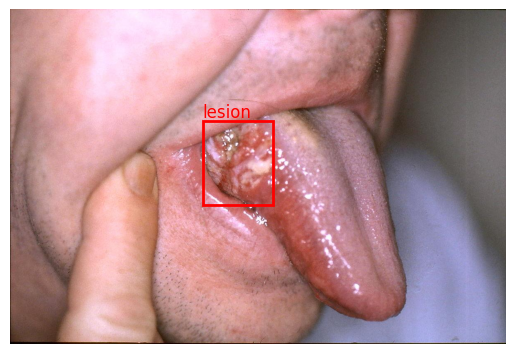

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from roboflow import Roboflow
import cv2
import json

# Load an image and its annotations
image_path = "/content/for_training-5/test/1200px-ZungenCa2a_jpg.rf.484a48535552eec46aa1144b0d5f2d6b.jpg"
annotation_path = "/content/for_training-5/test/_annotations.coco.json"

# Read the image using OpenCV
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Read the annotation file
with open(annotation_path) as f:
    annotations = json.load(f)

# Create a mapping of category IDs to category names
category_id_to_name = {category['id']: category['name'] for category in annotations['categories']}

# Plot the image
fig, ax = plt.subplots(1)
ax.imshow(image)
ax.axis('off')  # Turn off axis labels

# Plot the annotations with the name "lesion"
for annotation in annotations['annotations']:
    if annotation['image_id'] == 8:
        category_id = annotation['category_id']
        category_name = category_id_to_name[category_id]

        if category_name == "lesion":
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

            # Add text label
            ax.text(x, y - 10, 'lesion', color='red', fontsize=12)

plt.show()


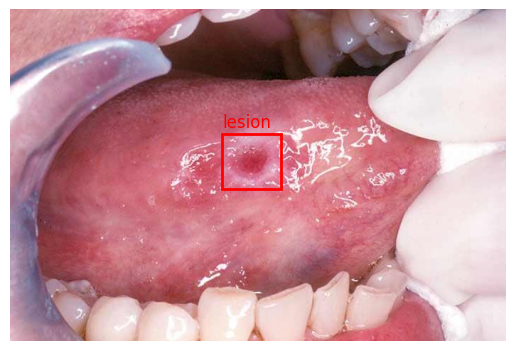

Annotated image saved to /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing/dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import os

# Define paths
image_path = "/content/for_training-5/valid/dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg"
annotation_path = "/content/for_training-5/valid/_annotations.coco.json"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing"

# Ensure the output folder exists
# os.makedirs(output_folder, exist_ok=True)

# Read the image using OpenCV
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Failed to load image: {image_path}")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Read the annotation file
with open(annotation_path) as f:
    annotations = json.load(f)

# Create a mapping of category IDs to category names
category_id_to_name = {category['id']: category['name'] for category in annotations['categories']}

# Plot the image
fig, ax = plt.subplots(1)
ax.imshow(image)
ax.axis('off')  # Turn off axis labels

# Plot the annotations with the name "lesion"
for annotation in annotations['annotations']:
    if annotation['image_id'] == 50:
        category_id = annotation['category_id']
        category_name = category_id_to_name[category_id]

        if category_name == "lesion":
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

            # Add text label
            ax.text(x, y - 10, 'lesion', color='red', fontsize=12)

# Define the output image path
output_image_path = os.path.join(output_folder, os.path.basename(image_path))

# Save the annotated image in the specified folder
plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0)
plt.show()

print(f"Annotated image saved to {output_image_path}")


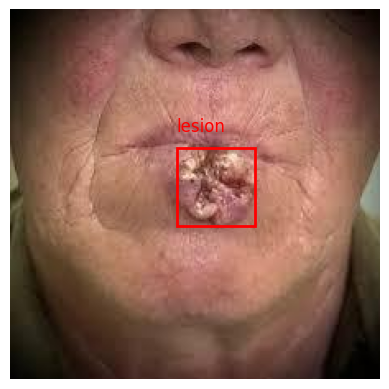

Annotated image saved to /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing/images-1-_jpeg.rf.af39d8b225281a9eb5dff9750e6bbb3b.jpg


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import os

# Define paths
image_path = "/content/for_training-5/test/images-1-_jpeg.rf.af39d8b225281a9eb5dff9750e6bbb3b.jpg"
annotation_path = "/content/for_training-5/test/_annotations.coco.json"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing"

# Ensure the output folder exists
# os.makedirs(output_folder, exist_ok=True)

# Read the image using OpenCV
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Failed to load image: {image_path}")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Read the annotation file
with open(annotation_path) as f:
    annotations = json.load(f)

# Create a mapping of category IDs to category names
category_id_to_name = {category['id']: category['name'] for category in annotations['categories']}

# Plot the image
fig, ax = plt.subplots(1)
ax.imshow(image)
ax.axis('off')  # Turn off axis labels

# Plot the annotations with the name "lesion"
for annotation in annotations['annotations']:
    if annotation['image_id'] == 37:
        category_id = annotation['category_id']
        category_name = category_id_to_name[category_id]

        if category_name == "lesion":
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

            # Add text label
            ax.text(x, y - 10, 'lesion', color='red', fontsize=12)

# Define the output image path
output_image_path = os.path.join(output_folder, os.path.basename(image_path))

# Save the annotated image in the specified folder
plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0)
plt.show()

print(f"Annotated image saved to {output_image_path}")


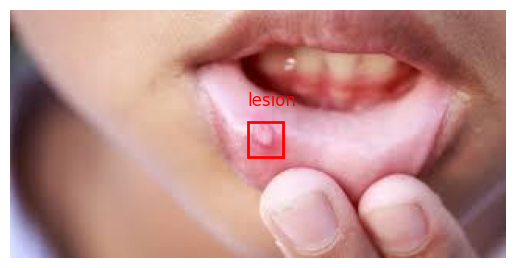

Annotated image saved to /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing/download-1-_jpeg.rf.6132cd0b8fe7771f5c049703e26c968d.jpg


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import os

# Define paths
image_path = "/content/for_training-5/test/download-1-_jpeg.rf.6132cd0b8fe7771f5c049703e26c968d.jpg"
annotation_path = "/content/for_training-5/test/_annotations.coco.json"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing"

# Ensure the output folder exists
# os.makedirs(output_folder, exist_ok=True)

# Read the image using OpenCV
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Failed to load image: {image_path}")

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Read the annotation file
with open(annotation_path) as f:
    annotations = json.load(f)

# Create a mapping of category IDs to category names
category_id_to_name = {category['id']: category['name'] for category in annotations['categories']}

# Plot the image
fig, ax = plt.subplots(1)
ax.imshow(image)
ax.axis('off')  # Turn off axis labels

# Plot the annotations with the name "lesion"
for annotation in annotations['annotations']:
    if annotation['image_id'] == 44:
        category_id = annotation['category_id']
        category_name = category_id_to_name[category_id]

        if category_name == "lesion":
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

            # Add text label
            ax.text(x, y - 10, 'lesion', color='red', fontsize=12)

# Define the output image path
output_image_path = os.path.join(output_folder, os.path.basename(image_path))

# Save the annotated image in the specified folder
plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0)
plt.show()

print(f"Annotated image saved to {output_image_path}")


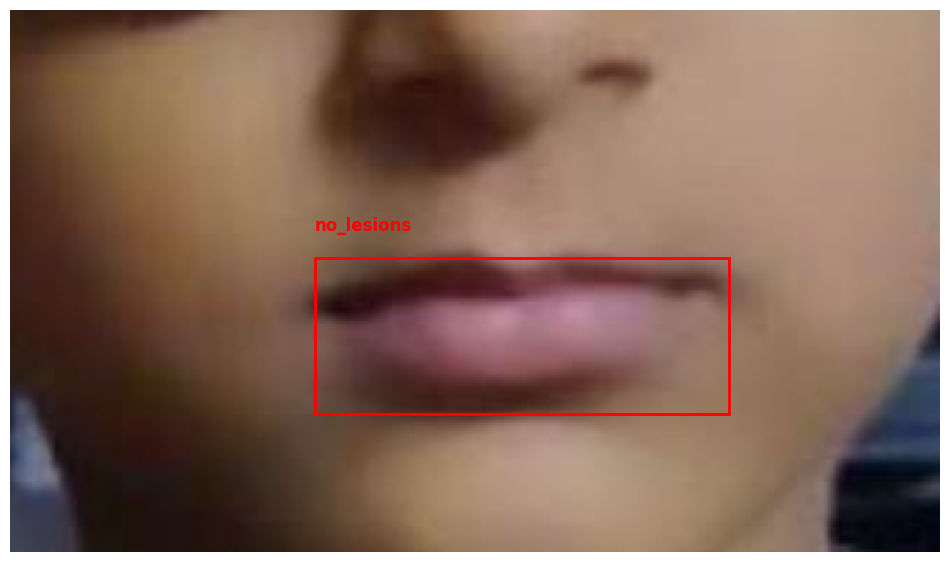

Annotated image saved to /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing/Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import os

# Define paths
image_path = "/content/for_training-5/valid/Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg"
annotation_path = "/content/for_training-5/valid/_annotations.coco.json"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing"

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Read the image using OpenCV
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Failed to load image: {image_path}")

# Convert image to RGB (OpenCV loads images in BGR format)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Read the annotation file
with open(annotation_path) as f:
    annotations = json.load(f)

# Create a mapping of category IDs to category names
category_id_to_name = {category['id']: category['name'] for category in annotations['categories']}

# Plot the image
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)
ax.axis('off')  # Turn off axis labels

# Plot the annotations with the name "no lesion"
for annotation in annotations['annotations']:
    if annotation['image_id'] == 51:
        category_id = annotation['category_id']
        category_name = category_id_to_name.get(category_id, None)

        if category_name == "no_lesions":
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

            # Add text label above the rectangle
            ax.text(x, y - 10, 'no_lesions', color='red', fontsize=12, fontweight='bold', ha='left')

# Define the output image path
output_image_path = os.path.join(output_folder, os.path.basename(image_path))

# Save the annotated image in the specified folder
plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0, dpi=300)
plt.show()

print(f"Annotated image saved to {output_image_path}")


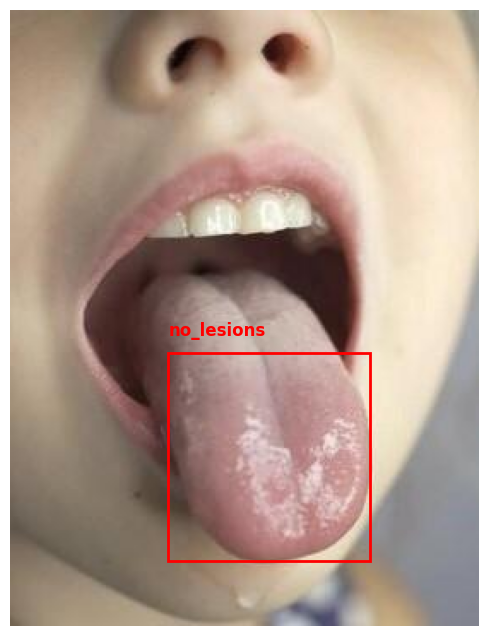

Annotated image saved to /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing/099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import cv2
import json
import os

# Define paths
image_path = "/content/for_training-5/valid/099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg"
annotation_path = "/content/for_training-5/valid/_annotations.coco.json"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/original_images_with_human_annotations_showing"

# Ensure the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Read the image using OpenCV
image = cv2.imread(image_path)
if image is None:
    raise ValueError(f"Failed to load image: {image_path}")

# Convert image to RGB (OpenCV loads images in BGR format)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Read the annotation file
with open(annotation_path) as f:
    annotations = json.load(f)

# Create a mapping of category IDs to category names
category_id_to_name = {category['id']: category['name'] for category in annotations['categories']}

# Plot the image
fig, ax = plt.subplots(1, figsize=(12, 8))
ax.imshow(image)
ax.axis('off')  # Turn off axis labels

# Plot the annotations with the name "no lesion"
for annotation in annotations['annotations']:
    if annotation['image_id'] == 25:
        category_id = annotation['category_id']
        category_name = category_id_to_name.get(category_id, None)

        if category_name == "no_lesions":
            bbox = annotation['bbox']
            x, y, width, height = bbox

            # Create a Rectangle patch
            rect = patches.Rectangle((x, y), width, height, linewidth=2, edgecolor='r', facecolor='none')

            # Add the patch to the Axes
            ax.add_patch(rect)

            # Add text label above the rectangle
            ax.text(x, y - 10, 'no_lesions', color='red', fontsize=12, fontweight='bold', ha='left')

# Define the output image path
output_image_path = os.path.join(output_folder, os.path.basename(image_path))

# Save the annotated image in the specified folder
plt.savefig(output_image_path, bbox_inches='tight', pad_inches=0, dpi=300)
plt.show()

print(f"Annotated image saved to {output_image_path}")


## Load Grounding DINO Model

In [ ]:
%cd /content/drive/MyDrive/GD/GroundingDINO

from groundingdino.util.inference import load_model, load_image, predict, annotate

model = load_model(CONFIG_PATH, WEIGHTS_PATH)

/content/drive/MyDrive/GD/GroundingDINO


final text_encoder_type: bert-base-uncased


tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

## GROUNDING DINO ON LESION

In [ ]:
%cd /content/drive/MyDrive/GD/GroundingDINO

/content/drive/MyDrive/GD/GroundingDINO


In [ ]:
# import os
# import pandas as pd
# import torch
# import cv2
# from groundingdino.util.inference import load_model, load_image, predict, annotate

# # Set device to CPU
# device = torch.device("cpu")

# # Load model
# model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# # Move the model to CPU
# model = model.to(device)

# # Set paths
# IMAGE_FOLDER = "dataset/test"
# ANNOTATED_FOLDER = "annotated_test"
# import shutil
# import os
# ORIGINAL_CSV = "dataset/test/_annotations.csv"
# CLASSES_COPY = "annotated_test/annotated_classes.csv"
# os.makedirs(os.path.dirname(CLASSES_COPY), exist_ok=True)

# # Copy the original CSV file to a new location
# shutil.copyfile(ORIGINAL_CSV, CLASSES_COPY)


# TEXT_PROMPT = "lesion ."

# BOX_THRESHOLD = 0.35
# TEXT_THRESHOLD = 0.25
# # Create annotated images folder if it doesn't exist
# os.makedirs(ANNOTATED_FOLDER, exist_ok=True)

# # Process each image
# for filename in os.listdir(IMAGE_FOLDER):
#     if filename.endswith(".csv"):
#         continue  # Skip CSV files

#     # Load image
#     image_path = os.path.join(IMAGE_FOLDER, filename)
#     image_source, image = load_image(image_path)
#     image = image.to(device)  # Move the image to CPU

#     # Predict and annotate
#     boxes, logits, phrases = predict(
#         model=model,
#         image=image,
#         caption=TEXT_PROMPT,
#         box_threshold=BOX_THRESHOLD,
#         text_threshold=TEXT_THRESHOLD
#     )
#     annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

#     # Save annotated image
#     annotated_image_path = os.path.join(ANNOTATED_FOLDER, f"annotated_{filename}")
#     cv2.imwrite(annotated_image_path, annotated_frame)

#     # Update _classes.csv file
#     classes_df = pd.read_csv(CLASSES_COPY)
#     # Find corresponding rows based on filename (assuming filename is unique identifier)
#     for index, row in classes_df.iterrows():
#         if row['filename'] == filename:
#             # Update or add necessary columns (logits, phrases) in your original _classes.csv structure
#             classes_df.at[index, 'logits'] = str(logits)
#             classes_df.at[index, 'phrases'] = ", ".join(phrases)
#             # Save back to the CSV file
#             classes_df.to_csv(CLASSES_COPY, index=False)

# print("Processing complete.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `B

Processing complete.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


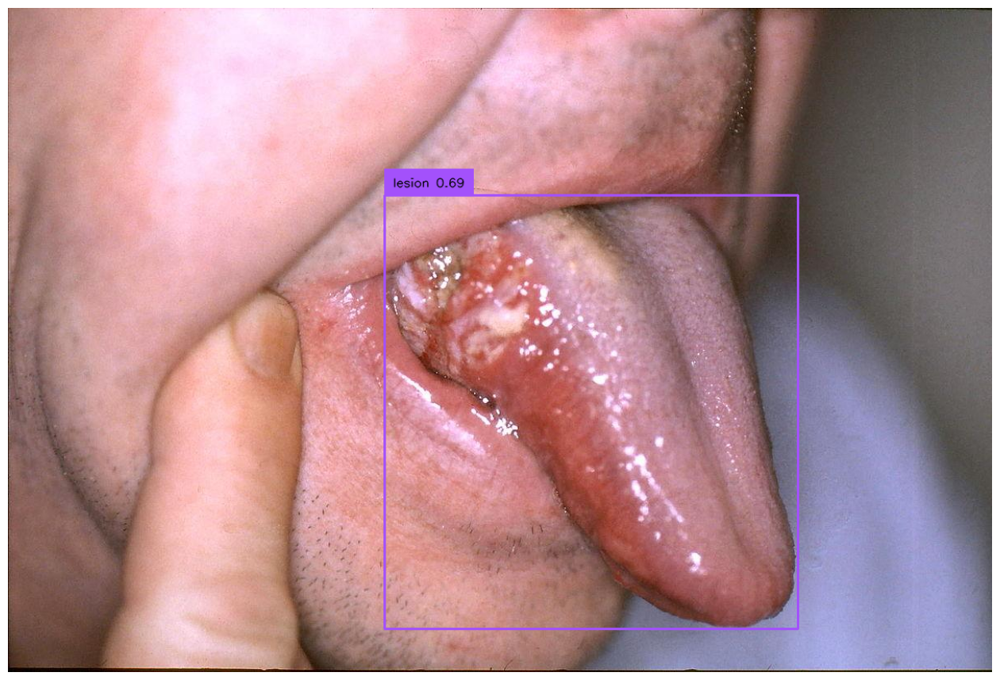

In [ ]:
import torch
#hi
# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# Move the model to CPU
model = model.to(device)

IMAGE_PATH = "dataset/test/1200px-ZungenCa2a_jpg.rf.484a48535552eec46aa1144b0d5f2d6b.jpg"
TEXT_PROMPT = "lesion ."

BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

# Move the image to CPU
image = image.to(device)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold= TEXT_THRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2.imwrite("output_testing/testing1.jpg", annotated_frame)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


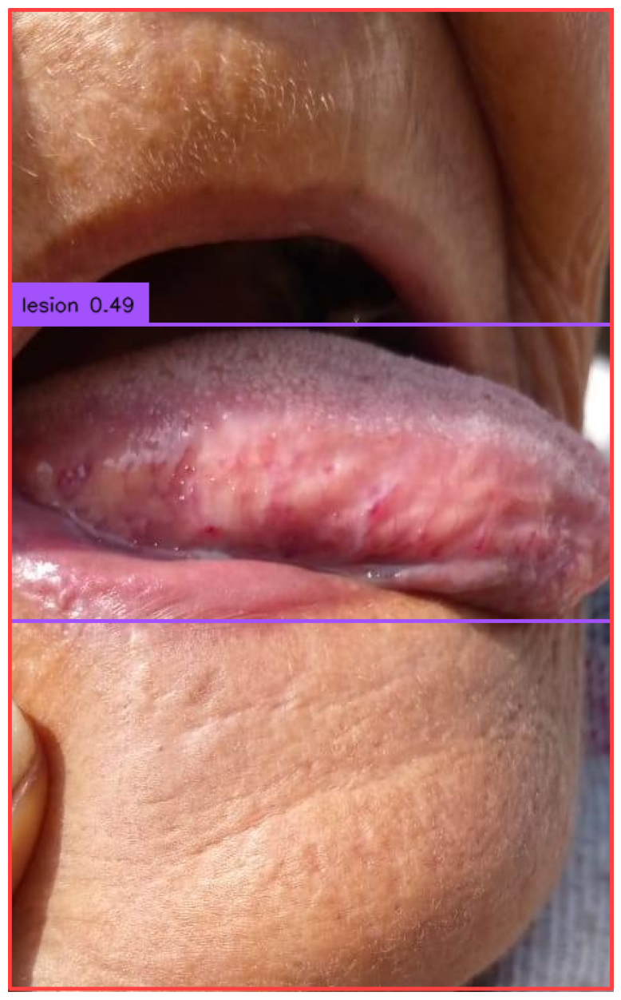

In [ ]:
import torch
#hi
# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# Move the model to CPU
model = model.to(device)

IMAGE_PATH = "dataset/test/378_jpeg.rf.d60c7844e951a276aa8d9a3e185721cc.jpg"
TEXT_PROMPT = "lesion ."

BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

# Move the image to CPU
image = image.to(device)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold= TEXT_THRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2.imwrite("output_testing/testing2.jpg", annotated_frame)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


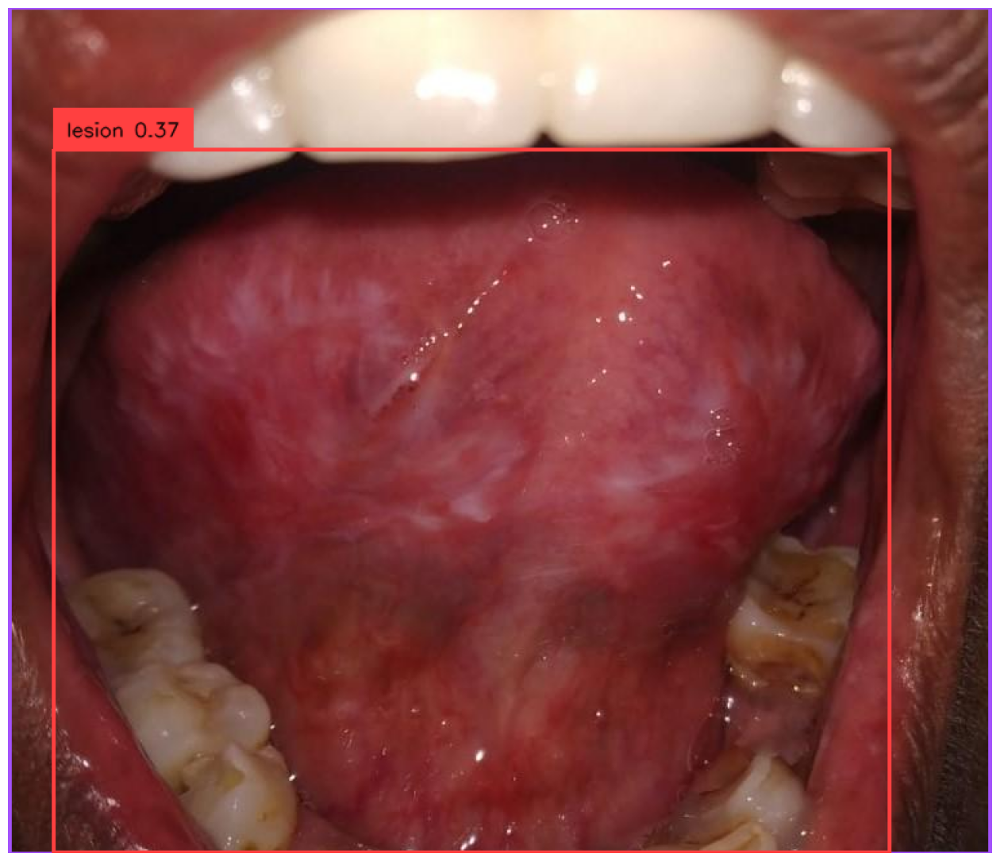

In [ ]:
import torch
#hi
# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# Move the model to CPU
model = model.to(device)

IMAGE_PATH = "dataset/test/70_jpg.rf.48a2810aac5c7d0f0b43501261cdbec3.jpg"
TEXT_PROMPT = "lesion ."

BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

# Move the image to CPU
image = image.to(device)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold= TEXT_THRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2.imwrite("output_testing/testing3.jpg", annotated_frame)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))


In [ ]:
import torch
import os
from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

# Load the model
model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
model = model.to(device)

# Folder paths
input_folder = "dataset/valid"
output_folder = "annotated_valid"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Parameters
TEXT_PROMPT = "lesion ."
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Loop through each image in the input folder
for image_filename in os.listdir(input_folder):
    if image_filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image formats if needed
        image_path = os.path.join(input_folder, image_filename)

        # Load and process the image
        image_source, image = load_image(image_path)
        image = image.to(device)

        # Make predictions
        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Annotate the image
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

        # Save the annotated image
        output_image_path = os.path.join(output_folder, f"annotated_{image_filename}")
        cv2.imwrite(output_image_path, annotated_frame)

        print(f"Processed and saved: {output_image_path}")

print("Processing completed.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_Screenshot-2020-03-16-at-10-47-50-AM_png.rf.0de51c0c1c4ff637b2b71b84533099cd.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_102_jpg.rf.edc5ca62081abc203715c6a8bae2f141.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_135_jpg.rf.122438f49da2620396bcbdd1690d92ce.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_119_jpg.rf.b1405042d0a0a68c75dfbcebc812ad56.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_006_jpeg.rf.e32f9cb2c2ae5f8e361ec2a1acc138d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_053_jpeg.rf.c9fd87564b9c1adf6421822af96d6acf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_031_jpeg.rf.8510753125a8315459ce215394f5ccdb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_113_jpg.rf.bd352a2232bd567ef9a3f4933a31ded3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_034_jpeg.rf.2f5111f6a233a96f199c7001d116aec5.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_009_jpeg.rf.5b65026b0284062ad90e8dcaaf29e642.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_111_jpg.rf.01aa7c7b89b638d483e000f768f47526.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_058_jpeg.rf.88e81000de98e387bf329d86bfb28391.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_107_jpg.rf.d60387790c44320f7c26b3ae103c438c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_109_jpg.rf.05ad5cec7c0eeda9746d8367c49dfb41.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_120_jpg.rf.60ed2256ed845ec200398b6f23567442.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_118_jpg.rf.d184fde7571ba82b14aad2f1b4f580a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_12654650-6954555-image-a-22_1556101508834-Edited_jpg.rf.6ddfdc0eeca8ca59a1c863e7e23202cb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_019_jpeg.rf.be953cbb506055fc971f043ef8bb969e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_103_jpg.rf.e7e900e80e5e3ff876151e8944d3e044.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_28_jpg.rf.bbb22cd7881e9cba00dd7219023fbb4e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_180_jpeg.rf.9ff2a5114b1b42d2efb5dfc73bb840e7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_324_jpeg.rf.51a06d2744a46a01fad622018be5eae7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_397_jpeg.rf.09c4f51eda871fdb6c6c718062f4973a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_16_jpg.rf.82387401d4a92d98767ef2464ccfb784.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_42_jpg.rf.b06e202cb9838026f0eec1d9eadcea72.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_20200314_1124072_jpg.rf.6d370ced59801a36315a040aaeefe724.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_256_jpeg.rf.a19a282b206bf88e246968391b24a636.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_45_jpg.rf.7bb07c0e09314609fae56e2d48c5b76b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_24_jpg.rf.8a26941c4c0624762c21a09bdcc7f41c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_145_jpg.rf.7bea1800f0ab9f86011ec6fcdea9ee1b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_20_jpg.rf.7135cf84b4cad66ad793c5a825ddf6b4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_157_jpg.rf.8156f1c63634b80eb29f1126789cf53c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_44_jpg.rf.0a04d7e5fe5b5d4cd9ac7b9f5188deaf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_294_jpeg.rf.44a4195aad224c03bdb7bb7ec6a79d2a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_3_jpg.rf.15b95a11f85f9ea2abd0c445c4d5362d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_194_jpeg.rf.c1b807b7a9540b318e7043014ef64918.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_439_jpeg.rf.932d5d5ac57c0b633f6e7f97428a90fc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_142_jpeg.rf.0f99a95ed282956e63d1b208c328291a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_29_jpg.rf.60f3dcfc412cea26e3f6a87d91dfc8fa.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_416_jpeg.rf.240ee999da313d125c02fae5e5d6a57f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_156_jpg.rf.12097cc9de7f36922f3c1b06e33e975f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_260_jpeg.rf.88f8748d2e974fb91e9f68875df65aed.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_19_jpg.rf.42d66a4f441c8a00685643f465191312.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_192_jpeg.rf.56e4d351e6eaec1573761fdce3a735ec.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_199_jpeg.rf.532a99ca3b61ef010398559fa08a355e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_38_jpg.rf.a72592f1fc9ac10194deb84ba92b8ce9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_163_jpeg.rf.798abcf45f617429222344951e550d02.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_2_jpg.rf.e5caba5354545c8f4ba6d9a68fe07a2f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_158_jpg.rf.8006c1d613a9865ba7c341ebc34eb8f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_43_jpg.rf.c39cd7d503590a7290645958876340e3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_28_jpg.rf.cab5ebcecf3dfecaf459f25c4db29a9c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_43_jpg.rf.a6d1c44fd537894aed25b401ee9ffd9a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_219_jpeg.rf.a0f3bec0184ec8715ab4fcbbd9423a0f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_272_jpeg.rf.f295543666198d897b74f6b01459b0be.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_20200314_1125032_jpg.rf.d2c3d16bc453dcf07a6830cea7547d16.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_20200314_1117132_jpg.rf.53cc52fe2620f41b081e0124760f7060.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_13_jpg.rf.7c4985951d0d931a475e5f70410f6690.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_141_jpg.rf.7021effffecc2afad2116a3c883a54f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_36_jpg.rf.ceaa293fa76466f0797e355a790fc572.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_340_jpeg.rf.d66fdf49b20405eacaf8e6696724dd4a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_172_jpeg.rf.c77ff7e921aabf4f72047e5f51b53935.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_20200314_1123332_jpg.rf.e2d5f8e6578a1071b3f37cab2450daa6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_186_jpeg.rf.f17a1181b582530e118157e92e833f9f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_135_jpg.rf.305b5c688fdba49303fab32897564f17.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_178_jpeg.rf.e16c472939bea241cbfb537b29ce12da.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_301_jpeg.rf.555a32ccd2a4415c07403857c00c8cbb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_17_jpg.rf.3c83906b3026a2d65a76b4d49a0d0df4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_45_jpg.rf.fd9a1a93e5af12e187f6b8ec55c1cc94.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_images-4-_jpeg.rf.d81aae08bbfd7216ea44b2b752b83417.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_download_jpeg.rf.89c5d54ea3fa854cca25591adf35f047.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset__654-What_Does_Mouth_Cancer_Look-642x361-Side-2_jpg.rf.109de57eea382734cb489665defc4ecc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_67_jpg.rf.e12e3e2913a82cfc9658f3edf8fcf094.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_50_jpg.rf.a42d16bc2f773b0d5bb0a52c5c6ea9d2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_60_jpg.rf.79a0172301f4790523be36f7028d29b1.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_is-lip-cancer-painful_jpg.rf.12637c6a81a8fef7ed233cd3e858c600.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_88_jpg.rf.8c4e09c47cd0487e006f11e9b6baa305.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_96_jpg.rf.9741c777f9d118d9a9d5ec9f96ed1d99.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_download-3-_jpeg.rf.01e35f1b4cafa8b70ac75f06334d0848.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_93_jpg.rf.188e4a64de418a316f1ba6efcd32d1cc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset_left_lateral_tongue_dysplasia_3_jpeg.rf.fa5053bbe0cb04983adb643fc9eb0112.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_images_jpeg.rf.62bf2fbc89ccb2c1c6a292ac02849a1d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_82_jpg.rf.d564347f98d08db40d734524fc5c1156.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_68_jpg.rf.e5c89c21fcc223f26673cc2822314dbe.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_62_jpg.rf.c46a269a2e08c86059643e390a15065d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_51_jpg.rf.ba9c5506b59b269566b9e380c132a462.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_87_jpg.rf.da48c40638765719b68118decf397ebc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_download_jpeg.rf.7916f589ad1efde6b68aedefcfe9e8de.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_55_jpg.rf.15f398979e5b4e38c9601fd3dce51866.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_64_jpg.rf.04e20981f2b8f5546a22b86485cab7b9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_images-8-_jpeg.rf.227daf7507ccb450f831333cdc84b3d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_52_jpg.rf.12def24e290f7742175501c3b2949573.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_87_jpg.rf.160819f75b19116a671a8bff4ef60987.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset_mouth-cancer-symptoms-1_jpg.rf.5d32364510485f0ac55b7882c725fa30.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_54_jpg.rf.b7836ee9b7984a84130a54d2594d239c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_7_jpg.rf.86203796c815365ec9e3b8bdd9bfa455.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset_oral-leukoplakia-br-image-credit-dermnet-new-zealand-br_jpg.rf.142a4b94ea2b0e689da9503c6c3631ba.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_lip-cancer-and-symptoms_jpg.rf.45fac6814fcf5a321a2789e4a6201f19.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_9_jpg.rf.aaeab6f76b18c79ac84ef899805297dc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_50_jpg.rf.fc83f06c724f8dfd32f662f6a925c27a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_first-sign-lip-cancer_c3094f88d448d26b_jpg.rf.043efd2a1c5eea2880042b07e52f0f60.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_images-2-_jpeg.rf.785b8d8f7ba8394fe525b5025f6fbc00.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_f063-001a-9781416025276_jpg.rf.a00754ed8cf0661b719de8e863db72d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_70_jpg.rf.024495d3e8465912ae54affa842d112f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_96_jpg.rf.3b36905f9dd2aa4fe684df1de78fb9b0.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_55_jpg.rf.175afcd6145b75cb4101c5e30c6e30a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_5_jpg.rf.c20a78734af874847fd5f14e3ad9ef2d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_80_jpg.rf.b56154c60f85645066a616f84fc36c1f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset_squamous-cell-carinoma-of-the-tongue_jpg.rf.dbe6502095730dd0f409a156b2ee16d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_images-4-_jpeg.rf.84ce095000a501cd5caaa23cc8f6a097.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_53_jpg.rf.ff1f785cd6c5c936523980b12529932d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_76_jpg.rf.13ab0786580378efd82769a4138e9b98.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_79_jpg.rf.151de3bf79f0f5933ac89bd5c93281ef.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_dataset_1366-fig-1_png.rf.7ebcf7d29cb9f732cf6a5dc399bd47ab.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_60_jpg.rf.4d229d6ebf0d1e49866e7fe6264697f6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid/annotated_46_jpg.rf.9b6f76ddcd2d1bb2adbfbe225507371e.jpg
Processed and saved: annotated_valid/annotated_47_jpg.rf.206737dc0e08a882f2fb689fdc61fe50.jpg
Processing completed.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


## GOUNDING DINO ON NOLESION

In [ ]:
import torch
import os
from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

# Load the model
model = load_model("groundingdino/config/GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
model = model.to(device)

# Folder paths
input_folder = "dataset/valid"
output_folder = "annotated_valid_no__lesion"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Parameters
TEXT_PROMPT = "nolesion ."
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Loop through each image in the input folder
for image_filename in os.listdir(input_folder):
    if image_filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image formats if needed
        image_path = os.path.join(input_folder, image_filename)

        # Load and process the image
        image_source, image = load_image(image_path)
        image = image.to(device)

        # Make predictions
        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Annotate the image
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

        # Save the annotated image
        output_image_path = os.path.join(output_folder, f"annotated_{image_filename}")
        cv2.imwrite(output_image_path, annotated_frame)

        print(f"Processed and saved: {output_image_path}")

print("Processing completed.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_Screenshot-2020-03-16-at-10-47-50-AM_png.rf.0de51c0c1c4ff637b2b71b84533099cd.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_102_jpg.rf.edc5ca62081abc203715c6a8bae2f141.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_135_jpg.rf.122438f49da2620396bcbdd1690d92ce.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_119_jpg.rf.b1405042d0a0a68c75dfbcebc812ad56.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_006_jpeg.rf.e32f9cb2c2ae5f8e361ec2a1acc138d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_053_jpeg.rf.c9fd87564b9c1adf6421822af96d6acf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_031_jpeg.rf.8510753125a8315459ce215394f5ccdb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_113_jpg.rf.bd352a2232bd567ef9a3f4933a31ded3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_034_jpeg.rf.2f5111f6a233a96f199c7001d116aec5.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_009_jpeg.rf.5b65026b0284062ad90e8dcaaf29e642.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_111_jpg.rf.01aa7c7b89b638d483e000f768f47526.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_058_jpeg.rf.88e81000de98e387bf329d86bfb28391.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_107_jpg.rf.d60387790c44320f7c26b3ae103c438c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_109_jpg.rf.05ad5cec7c0eeda9746d8367c49dfb41.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_120_jpg.rf.60ed2256ed845ec200398b6f23567442.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_118_jpg.rf.d184fde7571ba82b14aad2f1b4f580a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_12654650-6954555-image-a-22_1556101508834-Edited_jpg.rf.6ddfdc0eeca8ca59a1c863e7e23202cb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_019_jpeg.rf.be953cbb506055fc971f043ef8bb969e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_103_jpg.rf.e7e900e80e5e3ff876151e8944d3e044.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_28_jpg.rf.bbb22cd7881e9cba00dd7219023fbb4e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_180_jpeg.rf.9ff2a5114b1b42d2efb5dfc73bb840e7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_324_jpeg.rf.51a06d2744a46a01fad622018be5eae7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_397_jpeg.rf.09c4f51eda871fdb6c6c718062f4973a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_16_jpg.rf.82387401d4a92d98767ef2464ccfb784.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_42_jpg.rf.b06e202cb9838026f0eec1d9eadcea72.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_20200314_1124072_jpg.rf.6d370ced59801a36315a040aaeefe724.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_256_jpeg.rf.a19a282b206bf88e246968391b24a636.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_45_jpg.rf.7bb07c0e09314609fae56e2d48c5b76b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_24_jpg.rf.8a26941c4c0624762c21a09bdcc7f41c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_145_jpg.rf.7bea1800f0ab9f86011ec6fcdea9ee1b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_20_jpg.rf.7135cf84b4cad66ad793c5a825ddf6b4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_157_jpg.rf.8156f1c63634b80eb29f1126789cf53c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_44_jpg.rf.0a04d7e5fe5b5d4cd9ac7b9f5188deaf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_294_jpeg.rf.44a4195aad224c03bdb7bb7ec6a79d2a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_3_jpg.rf.15b95a11f85f9ea2abd0c445c4d5362d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_194_jpeg.rf.c1b807b7a9540b318e7043014ef64918.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_439_jpeg.rf.932d5d5ac57c0b633f6e7f97428a90fc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_142_jpeg.rf.0f99a95ed282956e63d1b208c328291a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_29_jpg.rf.60f3dcfc412cea26e3f6a87d91dfc8fa.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_416_jpeg.rf.240ee999da313d125c02fae5e5d6a57f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_156_jpg.rf.12097cc9de7f36922f3c1b06e33e975f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_260_jpeg.rf.88f8748d2e974fb91e9f68875df65aed.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_19_jpg.rf.42d66a4f441c8a00685643f465191312.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_192_jpeg.rf.56e4d351e6eaec1573761fdce3a735ec.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_199_jpeg.rf.532a99ca3b61ef010398559fa08a355e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_38_jpg.rf.a72592f1fc9ac10194deb84ba92b8ce9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_163_jpeg.rf.798abcf45f617429222344951e550d02.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_2_jpg.rf.e5caba5354545c8f4ba6d9a68fe07a2f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_158_jpg.rf.8006c1d613a9865ba7c341ebc34eb8f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_43_jpg.rf.c39cd7d503590a7290645958876340e3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_28_jpg.rf.cab5ebcecf3dfecaf459f25c4db29a9c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_43_jpg.rf.a6d1c44fd537894aed25b401ee9ffd9a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_219_jpeg.rf.a0f3bec0184ec8715ab4fcbbd9423a0f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_272_jpeg.rf.f295543666198d897b74f6b01459b0be.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_20200314_1125032_jpg.rf.d2c3d16bc453dcf07a6830cea7547d16.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_20200314_1117132_jpg.rf.53cc52fe2620f41b081e0124760f7060.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_13_jpg.rf.7c4985951d0d931a475e5f70410f6690.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_141_jpg.rf.7021effffecc2afad2116a3c883a54f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_36_jpg.rf.ceaa293fa76466f0797e355a790fc572.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_340_jpeg.rf.d66fdf49b20405eacaf8e6696724dd4a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_172_jpeg.rf.c77ff7e921aabf4f72047e5f51b53935.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_20200314_1123332_jpg.rf.e2d5f8e6578a1071b3f37cab2450daa6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_186_jpeg.rf.f17a1181b582530e118157e92e833f9f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_135_jpg.rf.305b5c688fdba49303fab32897564f17.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_178_jpeg.rf.e16c472939bea241cbfb537b29ce12da.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_301_jpeg.rf.555a32ccd2a4415c07403857c00c8cbb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_17_jpg.rf.3c83906b3026a2d65a76b4d49a0d0df4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_45_jpg.rf.fd9a1a93e5af12e187f6b8ec55c1cc94.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_images-4-_jpeg.rf.d81aae08bbfd7216ea44b2b752b83417.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_download_jpeg.rf.89c5d54ea3fa854cca25591adf35f047.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset__654-What_Does_Mouth_Cancer_Look-642x361-Side-2_jpg.rf.109de57eea382734cb489665defc4ecc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_67_jpg.rf.e12e3e2913a82cfc9658f3edf8fcf094.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_50_jpg.rf.a42d16bc2f773b0d5bb0a52c5c6ea9d2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_60_jpg.rf.79a0172301f4790523be36f7028d29b1.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_is-lip-cancer-painful_jpg.rf.12637c6a81a8fef7ed233cd3e858c600.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_88_jpg.rf.8c4e09c47cd0487e006f11e9b6baa305.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_96_jpg.rf.9741c777f9d118d9a9d5ec9f96ed1d99.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_download-3-_jpeg.rf.01e35f1b4cafa8b70ac75f06334d0848.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_93_jpg.rf.188e4a64de418a316f1ba6efcd32d1cc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset_left_lateral_tongue_dysplasia_3_jpeg.rf.fa5053bbe0cb04983adb643fc9eb0112.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_images_jpeg.rf.62bf2fbc89ccb2c1c6a292ac02849a1d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_82_jpg.rf.d564347f98d08db40d734524fc5c1156.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_68_jpg.rf.e5c89c21fcc223f26673cc2822314dbe.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_62_jpg.rf.c46a269a2e08c86059643e390a15065d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_51_jpg.rf.ba9c5506b59b269566b9e380c132a462.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_87_jpg.rf.da48c40638765719b68118decf397ebc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_download_jpeg.rf.7916f589ad1efde6b68aedefcfe9e8de.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_55_jpg.rf.15f398979e5b4e38c9601fd3dce51866.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_64_jpg.rf.04e20981f2b8f5546a22b86485cab7b9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_images-8-_jpeg.rf.227daf7507ccb450f831333cdc84b3d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_52_jpg.rf.12def24e290f7742175501c3b2949573.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_87_jpg.rf.160819f75b19116a671a8bff4ef60987.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset_mouth-cancer-symptoms-1_jpg.rf.5d32364510485f0ac55b7882c725fa30.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_54_jpg.rf.b7836ee9b7984a84130a54d2594d239c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_7_jpg.rf.86203796c815365ec9e3b8bdd9bfa455.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset_oral-leukoplakia-br-image-credit-dermnet-new-zealand-br_jpg.rf.142a4b94ea2b0e689da9503c6c3631ba.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_lip-cancer-and-symptoms_jpg.rf.45fac6814fcf5a321a2789e4a6201f19.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_9_jpg.rf.aaeab6f76b18c79ac84ef899805297dc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_50_jpg.rf.fc83f06c724f8dfd32f662f6a925c27a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_first-sign-lip-cancer_c3094f88d448d26b_jpg.rf.043efd2a1c5eea2880042b07e52f0f60.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_images-2-_jpeg.rf.785b8d8f7ba8394fe525b5025f6fbc00.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_f063-001a-9781416025276_jpg.rf.a00754ed8cf0661b719de8e863db72d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_70_jpg.rf.024495d3e8465912ae54affa842d112f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_96_jpg.rf.3b36905f9dd2aa4fe684df1de78fb9b0.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_55_jpg.rf.175afcd6145b75cb4101c5e30c6e30a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_5_jpg.rf.c20a78734af874847fd5f14e3ad9ef2d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_80_jpg.rf.b56154c60f85645066a616f84fc36c1f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset_squamous-cell-carinoma-of-the-tongue_jpg.rf.dbe6502095730dd0f409a156b2ee16d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_images-4-_jpeg.rf.84ce095000a501cd5caaa23cc8f6a097.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_53_jpg.rf.ff1f785cd6c5c936523980b12529932d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_76_jpg.rf.13ab0786580378efd82769a4138e9b98.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_79_jpg.rf.151de3bf79f0f5933ac89bd5c93281ef.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_dataset_1366-fig-1_png.rf.7ebcf7d29cb9f732cf6a5dc399bd47ab.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_60_jpg.rf.4d229d6ebf0d1e49866e7fe6264697f6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_no__lesion/annotated_46_jpg.rf.9b6f76ddcd2d1bb2adbfbe225507371e.jpg
Processed and saved: annotated_valid_no__lesion/annotated_47_jpg.rf.206737dc0e08a882f2fb689fdc61fe50.jpg
Processing completed.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


## TUNING

final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


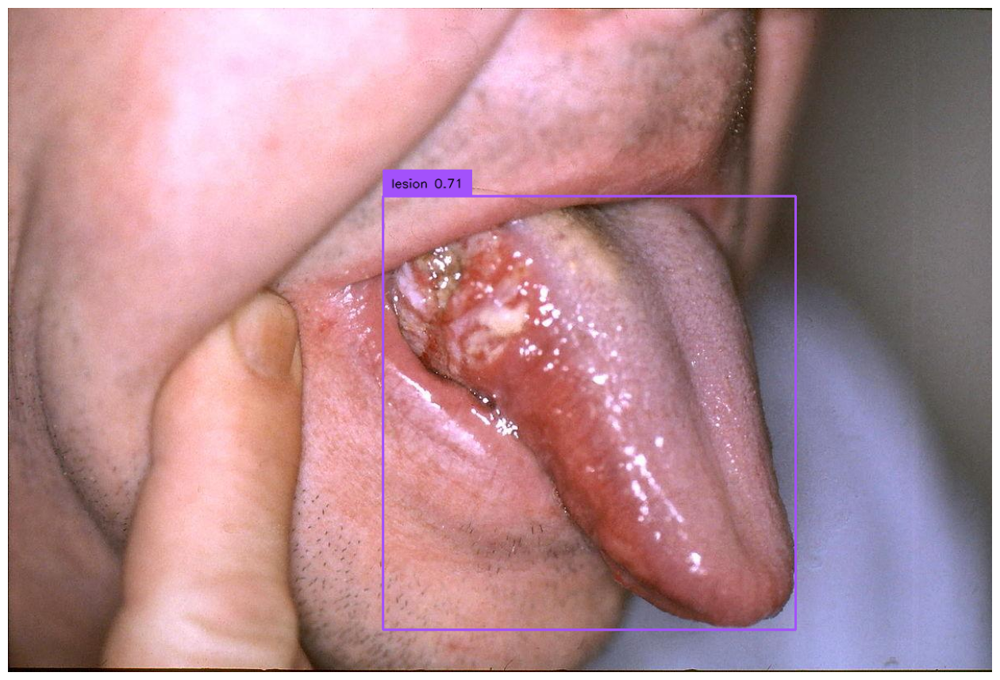

In [ ]:
import torch

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

model = load_model("groundingdino/config/tuning_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# Move the model to CPU
model = model.to(device)

IMAGE_PATH = "dataset/test/1200px-ZungenCa2a_jpg.rf.484a48535552eec46aa1144b0d5f2d6b.jpg"
TEXT_PROMPT = "lesion ."

BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

# Move the image to CPU
image = image.to(device)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold= TEXT_THRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2.imwrite("output_tuning/tuning_TEMW_10.jpg", annotated_frame)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


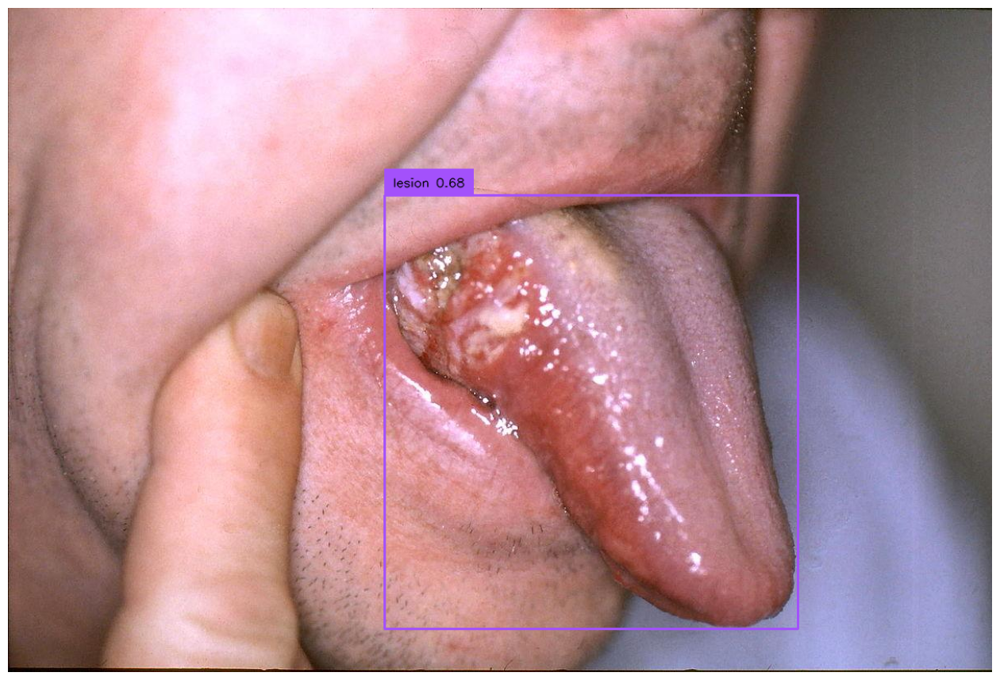

In [ ]:
import torch

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

model = load_model("groundingdino/config/tuning_decoder_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# Move the model to CPU
model = model.to(device)

IMAGE_PATH = "dataset/test/1200px-ZungenCa2a_jpg.rf.484a48535552eec46aa1144b0d5f2d6b.jpg"
TEXT_PROMPT = "lesion ."

BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

image_source, image = load_image(IMAGE_PATH)

# Move the image to CPU
image = image.to(device)

boxes, logits, phrases = predict(
    model=model,
    image=image,
    caption=TEXT_PROMPT,
    box_threshold=BOX_THRESHOLD,
    text_threshold= TEXT_THRESHOLD
)

annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)
cv2.imwrite("output_tuning/tuning_decoder_5_testing1.jpg", annotated_frame)

%matplotlib inline
sv.plot_image(annotated_frame, (16, 16))


In [ ]:
# import os
# import pandas as pd
# import torch
# import cv2
# from groundingdino.util.inference import load_model, load_image, predict, annotate

# # Set device to CPU
# device = torch.device("cpu")

# # Load model
# model = load_model("groundingdino/config/tuning_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
# # Move the model to CPU
# model = model.to(device)

# # Set paths
# IMAGE_FOLDER = "dataset/test"
# ANNOTATED_FOLDER = "annotated_test_tuning_TEMW"
# import shutil
# import os
# ORIGINAL_CSV = "dataset/test/_annotations.csv"
# CLASSES_COPY = "annotated_test/annotated_classes.csv"
# os.makedirs(os.path.dirname(CLASSES_COPY), exist_ok=True)

# # Copy the original CSV file to a new location
# shutil.copyfile(ORIGINAL_CSV, CLASSES_COPY)


# TEXT_PROMPT = "lesion ."

# BOX_THRESHOLD = 0.35
# TEXT_THRESHOLD = 0.25
# # Create annotated images folder if it doesn't exist
# os.makedirs(ANNOTATED_FOLDER, exist_ok=True)

# # Process each image
# for filename in os.listdir(IMAGE_FOLDER):
#     if filename.endswith(".csv"):
#         continue  # Skip CSV files

#     # Load image
#     image_path = os.path.join(IMAGE_FOLDER, filename)
#     image_source, image = load_image(image_path)
#     image = image.to(device)  # Move the image to CPU

#     # Predict and annotate
#     boxes, logits, phrases = predict(
#         model=model,
#         image=image,
#         caption=TEXT_PROMPT,
#         box_threshold=BOX_THRESHOLD,
#         text_threshold=TEXT_THRESHOLD
#     )
#     annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

#     # Save annotated image
#     annotated_image_path = os.path.join(ANNOTATED_FOLDER, f"annotated_{filename}")
#     cv2.imwrite(annotated_image_path, annotated_frame)

#     # Update _classes.csv file
#     classes_df = pd.read_csv(CLASSES_COPY)
#     # Find corresponding rows based on filename (assuming filename is unique identifier)
#     for index, row in classes_df.iterrows():
#         if row['filename'] == filename:
#             # Update or add necessary columns (logits, phrases) in your original _classes.csv structure
#             classes_df.at[index, 'logits'] = str(logits)
#             classes_df.at[index, 'phrases'] = ", ".join(phrases)
#             # Save back to the CSV file
#             classes_df.to_csv(CLASSES_COPY, index=False)

# print("Processing complete.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead
SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `B

Processing complete.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


In [ ]:
import torch
import os
from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

# Load the model
model = load_model("groundingdino/config/tuning_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
model = model.to(device)

# Folder paths
input_folder = "dataset/valid"
output_folder = "annotated_valid_tuning_TEMW"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Parameters
TEXT_PROMPT = "lesion ."
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Loop through each image in the input folder
for image_filename in os.listdir(input_folder):
    if image_filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image formats if needed
        image_path = os.path.join(input_folder, image_filename)

        # Load and process the image
        image_source, image = load_image(image_path)
        image = image.to(device)

        # Make predictions
        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Annotate the image
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

        # Save the annotated image
        output_image_path = os.path.join(output_folder, f"annotated_{image_filename}")
        cv2.imwrite(output_image_path, annotated_frame)

        print(f"Processed and saved: {output_image_path}")

print("Processing completed.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_Screenshot-2020-03-16-at-10-47-50-AM_png.rf.0de51c0c1c4ff637b2b71b84533099cd.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_102_jpg.rf.edc5ca62081abc203715c6a8bae2f141.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_135_jpg.rf.122438f49da2620396bcbdd1690d92ce.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_119_jpg.rf.b1405042d0a0a68c75dfbcebc812ad56.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_006_jpeg.rf.e32f9cb2c2ae5f8e361ec2a1acc138d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_053_jpeg.rf.c9fd87564b9c1adf6421822af96d6acf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_031_jpeg.rf.8510753125a8315459ce215394f5ccdb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_113_jpg.rf.bd352a2232bd567ef9a3f4933a31ded3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_034_jpeg.rf.2f5111f6a233a96f199c7001d116aec5.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_009_jpeg.rf.5b65026b0284062ad90e8dcaaf29e642.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_111_jpg.rf.01aa7c7b89b638d483e000f768f47526.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_058_jpeg.rf.88e81000de98e387bf329d86bfb28391.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_107_jpg.rf.d60387790c44320f7c26b3ae103c438c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_109_jpg.rf.05ad5cec7c0eeda9746d8367c49dfb41.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_120_jpg.rf.60ed2256ed845ec200398b6f23567442.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_118_jpg.rf.d184fde7571ba82b14aad2f1b4f580a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_12654650-6954555-image-a-22_1556101508834-Edited_jpg.rf.6ddfdc0eeca8ca59a1c863e7e23202cb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_019_jpeg.rf.be953cbb506055fc971f043ef8bb969e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_103_jpg.rf.e7e900e80e5e3ff876151e8944d3e044.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_28_jpg.rf.bbb22cd7881e9cba00dd7219023fbb4e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_180_jpeg.rf.9ff2a5114b1b42d2efb5dfc73bb840e7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_324_jpeg.rf.51a06d2744a46a01fad622018be5eae7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_397_jpeg.rf.09c4f51eda871fdb6c6c718062f4973a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_16_jpg.rf.82387401d4a92d98767ef2464ccfb784.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_42_jpg.rf.b06e202cb9838026f0eec1d9eadcea72.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_20200314_1124072_jpg.rf.6d370ced59801a36315a040aaeefe724.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_256_jpeg.rf.a19a282b206bf88e246968391b24a636.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_45_jpg.rf.7bb07c0e09314609fae56e2d48c5b76b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_24_jpg.rf.8a26941c4c0624762c21a09bdcc7f41c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_145_jpg.rf.7bea1800f0ab9f86011ec6fcdea9ee1b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_20_jpg.rf.7135cf84b4cad66ad793c5a825ddf6b4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_157_jpg.rf.8156f1c63634b80eb29f1126789cf53c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_44_jpg.rf.0a04d7e5fe5b5d4cd9ac7b9f5188deaf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_294_jpeg.rf.44a4195aad224c03bdb7bb7ec6a79d2a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_3_jpg.rf.15b95a11f85f9ea2abd0c445c4d5362d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_194_jpeg.rf.c1b807b7a9540b318e7043014ef64918.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_439_jpeg.rf.932d5d5ac57c0b633f6e7f97428a90fc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_142_jpeg.rf.0f99a95ed282956e63d1b208c328291a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_29_jpg.rf.60f3dcfc412cea26e3f6a87d91dfc8fa.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_416_jpeg.rf.240ee999da313d125c02fae5e5d6a57f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_156_jpg.rf.12097cc9de7f36922f3c1b06e33e975f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_260_jpeg.rf.88f8748d2e974fb91e9f68875df65aed.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_19_jpg.rf.42d66a4f441c8a00685643f465191312.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_192_jpeg.rf.56e4d351e6eaec1573761fdce3a735ec.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_199_jpeg.rf.532a99ca3b61ef010398559fa08a355e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_38_jpg.rf.a72592f1fc9ac10194deb84ba92b8ce9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_163_jpeg.rf.798abcf45f617429222344951e550d02.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_2_jpg.rf.e5caba5354545c8f4ba6d9a68fe07a2f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_158_jpg.rf.8006c1d613a9865ba7c341ebc34eb8f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_43_jpg.rf.c39cd7d503590a7290645958876340e3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_28_jpg.rf.cab5ebcecf3dfecaf459f25c4db29a9c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_43_jpg.rf.a6d1c44fd537894aed25b401ee9ffd9a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_219_jpeg.rf.a0f3bec0184ec8715ab4fcbbd9423a0f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_272_jpeg.rf.f295543666198d897b74f6b01459b0be.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_20200314_1125032_jpg.rf.d2c3d16bc453dcf07a6830cea7547d16.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_20200314_1117132_jpg.rf.53cc52fe2620f41b081e0124760f7060.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_13_jpg.rf.7c4985951d0d931a475e5f70410f6690.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_141_jpg.rf.7021effffecc2afad2116a3c883a54f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_36_jpg.rf.ceaa293fa76466f0797e355a790fc572.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_340_jpeg.rf.d66fdf49b20405eacaf8e6696724dd4a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_172_jpeg.rf.c77ff7e921aabf4f72047e5f51b53935.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_20200314_1123332_jpg.rf.e2d5f8e6578a1071b3f37cab2450daa6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_186_jpeg.rf.f17a1181b582530e118157e92e833f9f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_135_jpg.rf.305b5c688fdba49303fab32897564f17.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_178_jpeg.rf.e16c472939bea241cbfb537b29ce12da.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_301_jpeg.rf.555a32ccd2a4415c07403857c00c8cbb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_17_jpg.rf.3c83906b3026a2d65a76b4d49a0d0df4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_45_jpg.rf.fd9a1a93e5af12e187f6b8ec55c1cc94.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_images-4-_jpeg.rf.d81aae08bbfd7216ea44b2b752b83417.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_download_jpeg.rf.89c5d54ea3fa854cca25591adf35f047.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset__654-What_Does_Mouth_Cancer_Look-642x361-Side-2_jpg.rf.109de57eea382734cb489665defc4ecc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_67_jpg.rf.e12e3e2913a82cfc9658f3edf8fcf094.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_50_jpg.rf.a42d16bc2f773b0d5bb0a52c5c6ea9d2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_60_jpg.rf.79a0172301f4790523be36f7028d29b1.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_is-lip-cancer-painful_jpg.rf.12637c6a81a8fef7ed233cd3e858c600.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_88_jpg.rf.8c4e09c47cd0487e006f11e9b6baa305.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_96_jpg.rf.9741c777f9d118d9a9d5ec9f96ed1d99.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_download-3-_jpeg.rf.01e35f1b4cafa8b70ac75f06334d0848.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_93_jpg.rf.188e4a64de418a316f1ba6efcd32d1cc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset_left_lateral_tongue_dysplasia_3_jpeg.rf.fa5053bbe0cb04983adb643fc9eb0112.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_images_jpeg.rf.62bf2fbc89ccb2c1c6a292ac02849a1d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_82_jpg.rf.d564347f98d08db40d734524fc5c1156.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_68_jpg.rf.e5c89c21fcc223f26673cc2822314dbe.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_62_jpg.rf.c46a269a2e08c86059643e390a15065d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_51_jpg.rf.ba9c5506b59b269566b9e380c132a462.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_87_jpg.rf.da48c40638765719b68118decf397ebc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_download_jpeg.rf.7916f589ad1efde6b68aedefcfe9e8de.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_55_jpg.rf.15f398979e5b4e38c9601fd3dce51866.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_64_jpg.rf.04e20981f2b8f5546a22b86485cab7b9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_images-8-_jpeg.rf.227daf7507ccb450f831333cdc84b3d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_52_jpg.rf.12def24e290f7742175501c3b2949573.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_87_jpg.rf.160819f75b19116a671a8bff4ef60987.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset_mouth-cancer-symptoms-1_jpg.rf.5d32364510485f0ac55b7882c725fa30.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_54_jpg.rf.b7836ee9b7984a84130a54d2594d239c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_7_jpg.rf.86203796c815365ec9e3b8bdd9bfa455.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset_oral-leukoplakia-br-image-credit-dermnet-new-zealand-br_jpg.rf.142a4b94ea2b0e689da9503c6c3631ba.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_lip-cancer-and-symptoms_jpg.rf.45fac6814fcf5a321a2789e4a6201f19.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_9_jpg.rf.aaeab6f76b18c79ac84ef899805297dc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_50_jpg.rf.fc83f06c724f8dfd32f662f6a925c27a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_first-sign-lip-cancer_c3094f88d448d26b_jpg.rf.043efd2a1c5eea2880042b07e52f0f60.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_images-2-_jpeg.rf.785b8d8f7ba8394fe525b5025f6fbc00.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_f063-001a-9781416025276_jpg.rf.a00754ed8cf0661b719de8e863db72d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_70_jpg.rf.024495d3e8465912ae54affa842d112f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_96_jpg.rf.3b36905f9dd2aa4fe684df1de78fb9b0.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_55_jpg.rf.175afcd6145b75cb4101c5e30c6e30a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_5_jpg.rf.c20a78734af874847fd5f14e3ad9ef2d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_80_jpg.rf.b56154c60f85645066a616f84fc36c1f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset_squamous-cell-carinoma-of-the-tongue_jpg.rf.dbe6502095730dd0f409a156b2ee16d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_images-4-_jpeg.rf.84ce095000a501cd5caaa23cc8f6a097.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_53_jpg.rf.ff1f785cd6c5c936523980b12529932d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_76_jpg.rf.13ab0786580378efd82769a4138e9b98.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_79_jpg.rf.151de3bf79f0f5933ac89bd5c93281ef.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_dataset_1366-fig-1_png.rf.7ebcf7d29cb9f732cf6a5dc399bd47ab.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_60_jpg.rf.4d229d6ebf0d1e49866e7fe6264697f6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW/annotated_46_jpg.rf.9b6f76ddcd2d1bb2adbfbe225507371e.jpg
Processed and saved: annotated_valid_tuning_TEMW/annotated_47_jpg.rf.206737dc0e08a882f2fb689fdc61fe50.jpg
Processing completed.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


In [ ]:
import torch
import os
from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

# Load the model
model = load_model("groundingdino/config/tuning_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
model = model.to(device)

# Folder paths
input_folder = "dataset/valid"
output_folder = "annotated_valid_tuning_TEMW_nolesion"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Parameters
TEXT_PROMPT = "no lesion ."
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Loop through each image in the input folder
for image_filename in os.listdir(input_folder):
    if image_filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image formats if needed
        image_path = os.path.join(input_folder, image_filename)

        # Load and process the image
        image_source, image = load_image(image_path)
        image = image.to(device)

        # Make predictions
        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Annotate the image
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

        # Save the annotated image
        output_image_path = os.path.join(output_folder, f"annotated_{image_filename}")
        cv2.imwrite(output_image_path, annotated_frame)

        print(f"Processed and saved: {output_image_path}")

print("Processing completed.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_Screenshot-2020-03-16-at-10-47-50-AM_png.rf.0de51c0c1c4ff637b2b71b84533099cd.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_102_jpg.rf.edc5ca62081abc203715c6a8bae2f141.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_135_jpg.rf.122438f49da2620396bcbdd1690d92ce.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_119_jpg.rf.b1405042d0a0a68c75dfbcebc812ad56.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_006_jpeg.rf.e32f9cb2c2ae5f8e361ec2a1acc138d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_053_jpeg.rf.c9fd87564b9c1adf6421822af96d6acf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_031_jpeg.rf.8510753125a8315459ce215394f5ccdb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_113_jpg.rf.bd352a2232bd567ef9a3f4933a31ded3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_034_jpeg.rf.2f5111f6a233a96f199c7001d116aec5.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_009_jpeg.rf.5b65026b0284062ad90e8dcaaf29e642.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_111_jpg.rf.01aa7c7b89b638d483e000f768f47526.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_058_jpeg.rf.88e81000de98e387bf329d86bfb28391.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_107_jpg.rf.d60387790c44320f7c26b3ae103c438c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_109_jpg.rf.05ad5cec7c0eeda9746d8367c49dfb41.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_120_jpg.rf.60ed2256ed845ec200398b6f23567442.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_118_jpg.rf.d184fde7571ba82b14aad2f1b4f580a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_12654650-6954555-image-a-22_1556101508834-Edited_jpg.rf.6ddfdc0eeca8ca59a1c863e7e23202cb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_019_jpeg.rf.be953cbb506055fc971f043ef8bb969e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_103_jpg.rf.e7e900e80e5e3ff876151e8944d3e044.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_28_jpg.rf.bbb22cd7881e9cba00dd7219023fbb4e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_180_jpeg.rf.9ff2a5114b1b42d2efb5dfc73bb840e7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_324_jpeg.rf.51a06d2744a46a01fad622018be5eae7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_397_jpeg.rf.09c4f51eda871fdb6c6c718062f4973a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_16_jpg.rf.82387401d4a92d98767ef2464ccfb784.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_42_jpg.rf.b06e202cb9838026f0eec1d9eadcea72.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_20200314_1124072_jpg.rf.6d370ced59801a36315a040aaeefe724.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_256_jpeg.rf.a19a282b206bf88e246968391b24a636.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_45_jpg.rf.7bb07c0e09314609fae56e2d48c5b76b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_24_jpg.rf.8a26941c4c0624762c21a09bdcc7f41c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_145_jpg.rf.7bea1800f0ab9f86011ec6fcdea9ee1b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_20_jpg.rf.7135cf84b4cad66ad793c5a825ddf6b4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_157_jpg.rf.8156f1c63634b80eb29f1126789cf53c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_44_jpg.rf.0a04d7e5fe5b5d4cd9ac7b9f5188deaf.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_294_jpeg.rf.44a4195aad224c03bdb7bb7ec6a79d2a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_3_jpg.rf.15b95a11f85f9ea2abd0c445c4d5362d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_194_jpeg.rf.c1b807b7a9540b318e7043014ef64918.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_439_jpeg.rf.932d5d5ac57c0b633f6e7f97428a90fc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_142_jpeg.rf.0f99a95ed282956e63d1b208c328291a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_29_jpg.rf.60f3dcfc412cea26e3f6a87d91dfc8fa.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_416_jpeg.rf.240ee999da313d125c02fae5e5d6a57f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_156_jpg.rf.12097cc9de7f36922f3c1b06e33e975f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_260_jpeg.rf.88f8748d2e974fb91e9f68875df65aed.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_19_jpg.rf.42d66a4f441c8a00685643f465191312.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_192_jpeg.rf.56e4d351e6eaec1573761fdce3a735ec.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_199_jpeg.rf.532a99ca3b61ef010398559fa08a355e.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_38_jpg.rf.a72592f1fc9ac10194deb84ba92b8ce9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_163_jpeg.rf.798abcf45f617429222344951e550d02.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_2_jpg.rf.e5caba5354545c8f4ba6d9a68fe07a2f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_158_jpg.rf.8006c1d613a9865ba7c341ebc34eb8f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_43_jpg.rf.c39cd7d503590a7290645958876340e3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_28_jpg.rf.cab5ebcecf3dfecaf459f25c4db29a9c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_43_jpg.rf.a6d1c44fd537894aed25b401ee9ffd9a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_219_jpeg.rf.a0f3bec0184ec8715ab4fcbbd9423a0f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_272_jpeg.rf.f295543666198d897b74f6b01459b0be.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_20200314_1125032_jpg.rf.d2c3d16bc453dcf07a6830cea7547d16.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_20200314_1117132_jpg.rf.53cc52fe2620f41b081e0124760f7060.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_13_jpg.rf.7c4985951d0d931a475e5f70410f6690.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_141_jpg.rf.7021effffecc2afad2116a3c883a54f9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_36_jpg.rf.ceaa293fa76466f0797e355a790fc572.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_340_jpeg.rf.d66fdf49b20405eacaf8e6696724dd4a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_172_jpeg.rf.c77ff7e921aabf4f72047e5f51b53935.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_20200314_1123332_jpg.rf.e2d5f8e6578a1071b3f37cab2450daa6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_186_jpeg.rf.f17a1181b582530e118157e92e833f9f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_135_jpg.rf.305b5c688fdba49303fab32897564f17.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_178_jpeg.rf.e16c472939bea241cbfb537b29ce12da.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_301_jpeg.rf.555a32ccd2a4415c07403857c00c8cbb.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_17_jpg.rf.3c83906b3026a2d65a76b4d49a0d0df4.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_45_jpg.rf.fd9a1a93e5af12e187f6b8ec55c1cc94.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_images-4-_jpeg.rf.d81aae08bbfd7216ea44b2b752b83417.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_download_jpeg.rf.89c5d54ea3fa854cca25591adf35f047.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset__654-What_Does_Mouth_Cancer_Look-642x361-Side-2_jpg.rf.109de57eea382734cb489665defc4ecc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_67_jpg.rf.e12e3e2913a82cfc9658f3edf8fcf094.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_50_jpg.rf.a42d16bc2f773b0d5bb0a52c5c6ea9d2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_60_jpg.rf.79a0172301f4790523be36f7028d29b1.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_is-lip-cancer-painful_jpg.rf.12637c6a81a8fef7ed233cd3e858c600.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_88_jpg.rf.8c4e09c47cd0487e006f11e9b6baa305.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_96_jpg.rf.9741c777f9d118d9a9d5ec9f96ed1d99.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_download-3-_jpeg.rf.01e35f1b4cafa8b70ac75f06334d0848.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_93_jpg.rf.188e4a64de418a316f1ba6efcd32d1cc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset_left_lateral_tongue_dysplasia_3_jpeg.rf.fa5053bbe0cb04983adb643fc9eb0112.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_images_jpeg.rf.62bf2fbc89ccb2c1c6a292ac02849a1d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_82_jpg.rf.d564347f98d08db40d734524fc5c1156.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_68_jpg.rf.e5c89c21fcc223f26673cc2822314dbe.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_62_jpg.rf.c46a269a2e08c86059643e390a15065d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_51_jpg.rf.ba9c5506b59b269566b9e380c132a462.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_87_jpg.rf.da48c40638765719b68118decf397ebc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_download_jpeg.rf.7916f589ad1efde6b68aedefcfe9e8de.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_55_jpg.rf.15f398979e5b4e38c9601fd3dce51866.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_64_jpg.rf.04e20981f2b8f5546a22b86485cab7b9.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_images-8-_jpeg.rf.227daf7507ccb450f831333cdc84b3d6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_52_jpg.rf.12def24e290f7742175501c3b2949573.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_87_jpg.rf.160819f75b19116a671a8bff4ef60987.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset_mouth-cancer-symptoms-1_jpg.rf.5d32364510485f0ac55b7882c725fa30.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_54_jpg.rf.b7836ee9b7984a84130a54d2594d239c.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_7_jpg.rf.86203796c815365ec9e3b8bdd9bfa455.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset_oral-leukoplakia-br-image-credit-dermnet-new-zealand-br_jpg.rf.142a4b94ea2b0e689da9503c6c3631ba.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_lip-cancer-and-symptoms_jpg.rf.45fac6814fcf5a321a2789e4a6201f19.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_9_jpg.rf.aaeab6f76b18c79ac84ef899805297dc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_50_jpg.rf.fc83f06c724f8dfd32f662f6a925c27a.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_first-sign-lip-cancer_c3094f88d448d26b_jpg.rf.043efd2a1c5eea2880042b07e52f0f60.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_images-2-_jpeg.rf.785b8d8f7ba8394fe525b5025f6fbc00.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_f063-001a-9781416025276_jpg.rf.a00754ed8cf0661b719de8e863db72d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_70_jpg.rf.024495d3e8465912ae54affa842d112f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_96_jpg.rf.3b36905f9dd2aa4fe684df1de78fb9b0.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_55_jpg.rf.175afcd6145b75cb4101c5e30c6e30a2.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_5_jpg.rf.c20a78734af874847fd5f14e3ad9ef2d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_80_jpg.rf.b56154c60f85645066a616f84fc36c1f.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset_squamous-cell-carinoma-of-the-tongue_jpg.rf.dbe6502095730dd0f409a156b2ee16d3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_images-4-_jpeg.rf.84ce095000a501cd5caaa23cc8f6a097.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_53_jpg.rf.ff1f785cd6c5c936523980b12529932d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_76_jpg.rf.13ab0786580378efd82769a4138e9b98.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_79_jpg.rf.151de3bf79f0f5933ac89bd5c93281ef.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_dataset_1366-fig-1_png.rf.7ebcf7d29cb9f732cf6a5dc399bd47ab.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_60_jpg.rf.4d229d6ebf0d1e49866e7fe6264697f6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_46_jpg.rf.9b6f76ddcd2d1bb2adbfbe225507371e.jpg
Processed and saved: annotated_valid_tuning_TEMW_nolesion/annotated_47_jpg.rf.206737dc0e08a882f2fb689fdc61fe50.jpg
Processing completed.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


In [ ]:
import torch
import os
from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

# Load the model
model = load_model("groundingdino/config/tuning_decoder_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
model = model.to(device)

# Folder paths
input_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/orginal_images/lesion"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Parameters
TEXT_PROMPT = "lesion ."
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Loop through each image in the input folder
for image_filename in os.listdir(input_folder):
    if image_filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image formats if needed
        image_path = os.path.join(input_folder, image_filename)

        # Load and process the image
        image_source, image = load_image(image_path)
        image = image.to(device)

        # Make predictions
        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Annotate the image
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

        # Save the annotated image
        output_image_path = os.path.join(output_folder, f"annotated_{image_filename}")
        cv2.imwrite(output_image_path, annotated_frame)

        print(f"Processed and saved: {output_image_path}")

print("Processing completed.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_003.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_025.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_066.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_110.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_117.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_120.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_119.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_206.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_251.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_322.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_366.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_442.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_500.jpeg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_1200px-ZungenCa2a_jpg.rf.484a48535552eec46aa1144b0d5f2d6b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_378_jpeg.rf.d60c7844e951a276aa8d9a3e185721cc.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_70_jpg.rf.48a2810aac5c7d0f0b43501261cdbec3.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_images-1-_jpeg.rf.af39d8b225281a9eb5dff9750e6bbb3b.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_download-1-_jpeg.rf.6132cd0b8fe7771f5c049703e26c968d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_98_jpg.rf.571bc235b6cff686553fe886fd277e30.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_237_jpeg.rf.5b27e854a1a39608e28b03dc61e07a9d.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_166_jpeg.rf.4929334dca66388c316efe503a27d1c6.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_71_jpg.rf.d0f03552bf204cb65716a4b41036b004.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_52_jpg.rf.18c709bb7870a197430be1101f7224de.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_dataset_oral-cancer-screening_jpg.rf.7f33a954b401818727fc08f261579eee.jpg
Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/lesion/annotated_324_jpeg.rf.51a06d2744a46a01fad622018be5eae7.jpg
Processing completed.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


In [ ]:
import torch
import os
from groundingdino.util.inference import load_model, load_image, predict, annotate
import cv2

# Set device to CPU
if torch.backends.mps.is_available():
    device = torch.device("mps")
    print("using gpu")
else:
    device = torch.device("cpu")

# Load the model
model = load_model("groundingdino/config/tuning_decoder_GroundingDINO_SwinT_OGC.py", "weights/groundingdino_swint_ogc.pth")
model = model.to(device)

# Folder paths
input_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/orginal_images/no lesion"
output_folder = "/content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion"

# Create the output folder if it doesn't exist
os.makedirs(output_folder, exist_ok=True)

# Parameters
TEXT_PROMPT = "no lesion ."
BOX_THRESHOLD = 0.35
TEXT_THRESHOLD = 0.25

# Loop through each image in the input folder
for image_filename in os.listdir(input_folder):
    if image_filename.endswith((".jpg", ".jpeg", ".png")):  # Add other image formats if needed
        image_path = os.path.join(input_folder, image_filename)

        # Load and process the image
        image_source, image = load_image(image_path)
        image = image.to(device)

        # Make predictions
        boxes, logits, phrases = predict(
            model=model,
            image=image,
            caption=TEXT_PROMPT,
            box_threshold=BOX_THRESHOLD,
            text_threshold=TEXT_THRESHOLD
        )

        # Annotate the image
        annotated_frame = annotate(image_source=image_source, boxes=boxes, logits=logits, phrases=phrases)

        # Save the annotated image
        output_image_path = os.path.join(output_folder, f"annotated_{image_filename}")
        cv2.imwrite(output_image_path, annotated_frame)

        print(f"Processed and saved: {output_image_path}")

print("Processing completed.")


final text_encoder_type: bert-base-uncased


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_tongue (1).jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_tongue.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_tongue-tingling-in-person-with-their-tongue-sticking-out.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_Screenshot-2020-03-15-at-9-58-58-PM_png.rf.60675fb55d63fd4686f6ec9fa4b159e8.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_180_jpeg.rf.9ff2a5114b1b42d2efb5dfc73bb840e7.jpg


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_099_jpeg.rf.1b8a9d7a3af984c3d758c8a93779209a.jpg
Processed and saved: /content/drive/MyDrive/ITP Team 12/Tri 3/Wk 12 Submission/collated data/after (finetuning DECODER LAYER)/no lesion/annotated_images-8-_jpeg.rf.227daf7507ccb450f831333cdc84b3d6.jpg
Processing completed.


SupervisionWarnings: annotate is deprecated: `BoxAnnotator` is deprecated and will be removed in `supervision-0.22.0`. Use `BoundingBoxAnnotator` and `LabelAnnotator` instead


## EVALUATION RESULTS

### LINK TO COCO2017 DATASET
https://drive.google.com/drive/folders/15asSVudYUjRM9phaqLSekafo-6qmaBiU?usp=sharing

https://cocodataset.org/#download


In [ ]:
# IMPORTANT!!!!!!!!!!!!!!!!! MUST RUN THIS CELL!!!!!!!
import locale
locale.getpreferredencoding = lambda: "UTF-8"

In [ ]:
# !unzip "/content/coco2017labels-segments.zip" -d "/content/drive/MyDrive/coco2017"

Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000153224.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000249549.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000313647.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000036331.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000030998.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000527961.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000218060.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000519657.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000078738.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000060177.txt  
  inflating: /content/drive/MyDrive/coco2017/coco/labels/train2017/000000490701.txt  
  i

In [ ]:
# BASELINE EVALUATION
!CUDA_VISIBLE_DEVICES=0 \
python /content/GroundingDINO/demo/test_ap_on_coco.py \
 -c /content/GroundingDINO/groundingdino/config/GroundingDINO_SwinT_OGC.py \
 -p /content/weights/groundingdino_swint_ogc.pth \
 --anno_path /content/drive/MyDrive/coco2017/coco/annotations/instances_val2017.json \
 --image_dir /content/drive/MyDrive/coco2017/coco/images/val2017

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
final text_encoder_type: bert-base-uncased
loading annotations into memory...
Done (t=0.93s)
creating index...
index created!
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
final text_encoder_type: bert-base-uncased
Input text prompt: person . bicycle . car . 

In [ ]:
# TUNING PE_TEMPERATUREW = 10
!CUDA_VISIBLE_DEVICES=0 \
python /content/drive/MyDrive/GD/GroundingDINO/demo/test_ap_on_coco.py \
 -c /content/drive/MyDrive/GD/GroundingDINO/groundingdino/config/tuning_GroundingDINO_SwinT_OGC.py \
 -p /content/drive/MyDrive/GD/GroundingDINO/weights/groundingdino_swint_ogc.pth \
 --anno_path /content/drive/MyDrive/coco2017/coco/annotations/instances_val2017.json \
 --image_dir /content/drive/MyDrive/coco2017/coco/images/val2017

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
final text_encoder_type: bert-base-uncased
loading annotations into memory...
Done (t=3.07s)
creating index...
index created!
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
final text_encoder_type: bert-base-uncased
Input text prompt: person . bicycle . car . 

In [ ]:
# TUNING DEC_LAYERS=5
!CUDA_VISIBLE_DEVICES=0 \
python /content/drive/MyDrive/GD/GroundingDINO/demo/test_ap_on_coco.py \
 -c /content/drive/MyDrive/GD/GroundingDINO/groundingdino/config/tuning_decoder_GroundingDINO_SwinT_OGC.py \
 -p /content/drive/MyDrive/GD/GroundingDINO/weights/groundingdino_swint_ogc.pth \
 --anno_path /content/drive/MyDrive/coco2017/coco/annotations/instances_val2017.json \
 --image_dir /content/drive/MyDrive/coco2017/coco/images/val2017

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
final text_encoder_type: bert-base-uncased
loading annotations into memory...
Done (t=3.33s)
creating index...
index created!
final text_encoder_type: bert-base-uncased
Input text prompt: person . bicycle . car . motorcycle . airplane . bus . train . truck . boat . traffic light . fire hydrant . stop sign . parking meter . bench . bird . cat . dog . horse . sheep . cow . elephant . bear . zebra . giraffe . backpack . umbrella . handbag . tie . suitcase . frisbee . skis . snowboard . sports ball . kite . baseball bat . baseball glove . skateboard . surfboard . tennis racket . bottle . wine glass . cup . fork . knife . spoon . bowl . banana . apple . sandwich . orange . broccoli . 

In [ ]:
# TUNING DEC_LAYERS=7
!CUDA_VISIBLE_DEVICES=0 \
python /content/drive/MyDrive/GD/GroundingDINO/demo/test_ap_on_coco.py \
 -c /content/drive/MyDrive/GD/GroundingDINO/groundingdino/config/tuning_other_GroundingDINO_SwinT_OGC.py \
 -p /content/drive/MyDrive/GD/GroundingDINO/weights/groundingdino_swint_ogc.pth \
 --anno_path /content/drive/MyDrive/coco2017/coco/annotations/instances_val2017.json \
 --image_dir /content/drive/MyDrive/coco2017/coco/images/val2017

/usr/local/lib/python3.10/dist-packages/torch/functional.py:512: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3587.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
final text_encoder_type: bert-base-uncased
loading annotations into memory...
Done (t=0.57s)
creating index...
index created!
final text_encoder_type: bert-base-uncased
Input text prompt: person . bicycle . car . motorcycle . airplane . bus . train . truck . boat . traffic light . fire hydrant . stop sign . parking meter . bench . bird . cat . dog . horse . sheep . cow . elephant . bear . zebra . giraffe . backpack . umbrella . handbag . tie . suitcase . frisbee . skis . snowboard . sports ball . kite . baseball bat . baseball glove . skateboard . surfboard . tennis racket . bottle . wine glass . cup . fork . knife . spoon . bowl . banana . apple . sandwich . orange . broccoli . 